# Selección de variables


In [1]:
import pandas as pd
import numpy as np

import missingno as msno
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split 
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.decomposition import TruncatedSVD

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
import datetime
from dateutil.parser import parse
from sklearn.tree import  DecisionTreeClassifier
import plotly.graph_objects as go
import umap

In [2]:
# Seteo jupyter notebook
pd.set_option('display.max_columns', None)

In [3]:
Data=pd.read_csv("cleaned_01June2022.csv").drop(columns=["Unnamed: 0"]).fillna("")
Data.head()

c:\Users\Jose Luis\anaconda3\envs\Programacion_Cientifica\lib\site-packages\IPython\core\interactiveshell.py:3441: DtypeWarning: Columns (40) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,pref_B-B,pref_D-E,pref_C-D,pref_A-A,Duracion_Campaña,B,C,lec_B-B,lec_E-E,lec_D-E,lec_C-D,lec_A-A,num_comunicaciones,Length,Monto,Frequency,Periodicity,Recency,F-D,F-H,F-I,F-J,G-K,A-G,A-K,C-C,D-F,E-F,A-L,Positivo,Negativo,Sin Info,Edad,Sexo,Renta,Recibe_sueldo_en_cuenta,Segmento_consumidor,Meses_antiguedad,Comuna,Ciudad,Estado_civil,Principalidad,Profesion,Target
0,0.0,0.0,0.0,0.0,1.0,4.0,5.0,5.0,0.0,0.0,0.0,0.0,22.0,371,180754.821871,396,91.0,652.012626,17,19,2,19,47,18,274,0,0,0,0,36,342,18,Mayor a 70,1,R1,0,A,Mayor a 10 años,331.0,13.0,D,B,P164,
1,0.0,0.0,0.0,0.0,1.0,2.0,9.0,14.0,1.0,1.0,3.0,0.0,21.0,371,303094.160627,614,93.0,619.035831,9,5,2,19,365,19,148,6,14,3,0,51,544,19,Mayor a 70,1,R9,0,B,Mayor a 10 años,37.0,5.0,D,E,P164,D-E C-D E-E B-B
2,0.0,0.0,0.0,0.0,1.0,2.0,2.0,5.0,0.0,0.0,0.0,0.0,20.0,371,144339.196858,536,89.0,614.389925,15,19,5,19,163,37,257,0,0,10,1,44,455,37,Mayor a 70,1,R9,1,B,Mayor a 10 años,19.0,4.0,B,D,P114,E-E A-A B-B
3,0.0,0.0,0.0,0.0,1.0,6.0,6.0,8.0,0.0,1.0,1.0,0.0,15.0,371,154439.534968,416,102.0,649.634615,2,17,16,17,266,16,69,0,2,3,0,23,377,16,Mayor a 70,1,R4,0,A,Mayor a 10 años,91.0,13.0,D,B,P85,E-E B-B D-E
4,0.0,0.0,0.0,0.0,1.0,2.0,3.0,1.0,0.0,0.0,1.0,0.0,26.0,371,128719.371341,395,107.0,629.587342,2,15,13,17,272,20,51,0,2,0,0,22,353,20,Mayor a 70,1,R5,0,A,Mayor a 10 años,34.0,5.0,B,C,P143,D-E A-A


<AxesSubplot:>

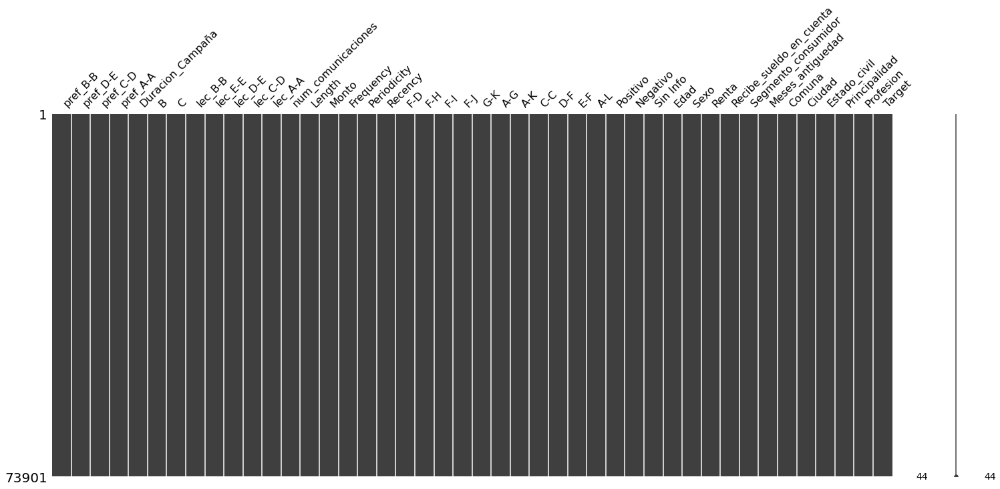

In [4]:
# Missings
msno.matrix(Data)

 **Matriz de correlación**

In [5]:
# datos categorical
categorical=list(Data.select_dtypes(include=["category","object"]).columns)

In [6]:
# Replace valores categoricos por númericos
for i in categorical:
    dic={}
    k=0
    for j in Data[i].unique():
        k=k+1
        dic[j]=k
    Data[i].replace(dic,inplace=True)

In [7]:
# Features - labels

features = Data.drop(columns=["Target"]).copy() 
labels = Data.loc[:,"Target"].copy()

# Generación de conjuntos de train y test
X_train, X_test, y_train, y_test = train_test_split(
    features, labels, test_size=0.33,random_state=50)


In [8]:
correlation=(X_train.join(y_train)).corr()

In [58]:
aux_corr=pd.DataFrame(correlation["Target"].sort_values(ascending=False)).query("index!='Target'")

In [61]:
aux_corr

,Target
Positivo,0.355486
C-C,0.336275
Frequency,0.232433
num_comunicaciones,0.212837
Negativo,0.210417
Recency,0.208726
A-K,0.202375
F-J,0.201948
lec_C-D,0.200493
B,0.196898


In [12]:
aux_corr.query("Target>0.1 and index!='Target'").index

Index(['Positivo', 'C-C', 'Frequency', 'num_comunicaciones', 'Negativo',
       'Recency', 'A-K', 'F-J', 'lec_C-D', 'B', 'Principalidad', 'E-F',
       'Sin Info', 'A-G', 'D-F', 'Length', 'C', 'pref_A-A', 'lec_B-B', 'F-I',
       'F-H', 'Duracion_Campaña', 'pref_C-D', 'Segmento_consumidor'],
      dtype='object')

**Normalización de variables**

In [33]:
# Columns transformer
preprocessing_transformer = ColumnTransformer(
    transformers=[
        ('MinMaxScaler',MinMaxScaler(),
         features.columns),
    ])

pipe = Pipeline(
    [("preprocesamiento", preprocessing_transformer)]
)

In [34]:
# Entrenamiento de pípeline
X_train=pd.DataFrame(pipe.fit_transform(X_train),columns=features.columns)

In [35]:
# Según el aporte de información con el criterio gini de un arbol de decisión
fs = DecisionTreeClassifier(criterion='gini', max_depth=10, random_state=1)
fs.fit(X_train, y_train.astype(int))

DecisionTreeClassifier(max_depth=10, random_state=1)

In [36]:
var_num = 30
table = pd.DataFrame({'Tags': features.columns, 'Value': fs.feature_importances_})
table['Abs_Value'] = table['Value'].abs()
table = table[table['Abs_Value']>0].sort_values(by='Abs_Value', ascending=False, ignore_index=True)
tree_fs = table.loc[:var_num, 'Tags'].to_list()

In [66]:
print(tree_fs)

['E-F', 'C-C', 'D-F', 'A-K', 'pref_A-A', 'num_comunicaciones', 'Length', 'Recency', 'Positivo', 'Sin Info', 'F-I', 'Periodicity', 'Monto', 'B', 'Frequency', 'lec_B-B', 'G-K', 'F-J', 'Comuna', 'Edad', 'F-D', 'Ciudad', 'Profesion', 'Negativo', 'Renta', 'F-H', 'lec_A-A', 'Principalidad', 'A-L', 'lec_C-D', 'Estado_civil']


In [37]:
# Plot
fig = go.Figure([go.Bar(x=table["Tags"], y=table["Abs_Value"])])

fig.update_layout(
    title_text="Importancia de variables",
)

fig.show()

In [63]:
aux_corr

,Target
Positivo,0.355486
C-C,0.336275
Frequency,0.232433
num_comunicaciones,0.212837
Negativo,0.210417
Recency,0.208726
A-K,0.202375
F-J,0.201948
lec_C-D,0.200493
B,0.196898


In [38]:
# Corr
correlations = features.corr()

fig=px.imshow(correlations,
          labels=dict(x="", y="", color="Correlation"),
          x=features.columns,
          y=features.columns,
          zmin=-1,
          zmax=1,
          color_continuous_scale="Inferno")

fig.layout.height = 1000
fig.layout.width = 1000

fig.show()

In [39]:
def corrkill(dataframe, features, corr_cut=0.5):

    df = dataframe[features]
    dfcorr = pd.DataFrame(np.triu(df.corr()), columns=df.columns, index=df.columns)
    dfcorr = dfcorr.stack().reset_index()
    dfcorr.columns = ['Feat1','Feat2','Val']
    dfcorr = dfcorr[~dfcorr['Val'].isin([0,1])]
    dfcorr = dfcorr[dfcorr['Val'].abs()>corr_cut]
    
    return list(dfcorr['Feat2']), dfcorr

In [46]:
features

,pref_B-B,pref_D-E,pref_C-D,pref_A-A,Duracion_Campaña,B,C,lec_B-B,lec_E-E,lec_D-E,lec_C-D,lec_A-A,num_comunicaciones,Length,Monto,Frequency,Periodicity,Recency,F-D,F-H,F-I,F-J,G-K,A-G,A-K,C-C,D-F,E-F,A-L,Positivo,Negativo,Sin Info,Edad,Sexo,Renta,Recibe_sueldo_en_cuenta,Segmento_consumidor,Meses_antiguedad,Comuna,Ciudad,Estado_civil,Principalidad,Profesion
0,0.0,0.0,0.0,0.0,1.0,4.0,5.0,5.0,0.0,0.0,0.0,0.0,22.0,371,180754.821871,396,91.0,652.012626,17,19,2,19,47,18,274,0,0,0,0,36,342,18,1,1,1,0,1,1,1,1,1,1,1
1,0.0,0.0,0.0,0.0,1.0,2.0,9.0,14.0,1.0,1.0,3.0,0.0,21.0,371,303094.160627,614,93.0,619.035831,9,5,2,19,365,19,148,6,14,3,0,51,544,19,1,1,2,0,2,1,2,2,1,2,1
2,0.0,0.0,0.0,0.0,1.0,2.0,2.0,5.0,0.0,0.0,0.0,0.0,20.0,371,144339.196858,536,89.0,614.389925,15,19,5,19,163,37,257,0,0,10,1,44,455,37,1,1,2,1,2,1,3,3,2,3,2
3,0.0,0.0,0.0,0.0,1.0,6.0,6.0,8.0,0.0,1.0,1.0,0.0,15.0,371,154439.534968,416,102.0,649.634615,2,17,16,17,266,16,69,0,2,3,0,23,377,16,1,1,3,0,1,1,4,1,1,1,3
4,0.0,0.0,0.0,0.0,1.0,2.0,3.0,1.0,0.0,0.0,1.0,0.0,26.0,371,128719.371341,395,107.0,629.587342,2,15,13,17,272,20,51,0,2,0,0,22,353,20,1,1,4,0,1,1,5,2,2,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73896,0.0,0.0,0.0,0.0,1.0,2.0,9.0,12.0,1.0,2.0,2.0,0.0,19.0,371,135008.940029,482,105.0,608.404564,9,9,18,19,247,18,141,0,7,2,0,37,427,18,11,0,5,0,1,4,24,21,3,8,209
73897,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,2.0,27.0,371,134945.557443,465,99.0,620.189247,8,7,18,16,258,17,141,0,0,0,0,24,424,17,9,0,1,0,1,4,12,18,2,8,209
73898,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,10.0,371,660761.217238,62,132.0,577.548387,17,7,0,19,0,1,2,3,0,4,0,45,16,1,5,1,1,0,1,4,93,21,2,8,209
73899,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,10.0,371,132780.980243,208,118.0,606.610577,2,13,15,18,56,19,78,0,2,2,0,22,167,19,7,0,5,0,1,4,8,18,3,8,209


In [52]:
a,b=corrkill(X_train,X_train.columns,corr_cut=0.5)

In [55]:
b.sort_values('Val',ascending=False)

,Feat1,Feat2,Val
590,Frequency,Negativo,0.995811
268,lec_E-E,lec_D-E,0.901143
180,C,lec_B-B,0.828995
891,G-K,Negativo,0.691472
491,Length,Recency,0.686973
847,F-J,Positivo,0.678430
582,Frequency,G-K,0.673466
490,Length,Periodicity,0.661785
584,Frequency,A-K,0.650796
977,A-K,Negativo,0.641907


In [40]:
collinearity, table_cor=corrkill(features, tree_fs)
tag_select = [i for i in tree_fs if i not in collinearity]
tags_view_corr = features[tag_select].copy().reset_index(drop=True)

In [41]:
tag_select

['E-F',
 'C-C',
 'D-F',
 'A-K',
 'pref_A-A',
 'num_comunicaciones',
 'Length',
 'Sin Info',
 'F-I',
 'Monto',
 'B',
 'lec_B-B',
 'Comuna',
 'Edad',
 'Ciudad',
 'Profesion',
 'Renta',
 'F-H',
 'lec_A-A',
 'Principalidad',
 'A-L',
 'lec_C-D',
 'Estado_civil']

In [42]:
# Corr
correlations = tags_view_corr.corr()

fig=px.imshow(correlations,
          labels=dict(x="", y="", color="Correlation"),
          x=tag_select,
          y=tag_select,
          zmin=-1,
          zmax=1,
          color_continuous_scale="Inferno")

fig.layout.height = 700
fig.layout.width = 700
fig.update_xaxes(
        tickangle = 45)

fig.show()

# Visualización de baja dimensionalidad

In [23]:
Data=pd.read_csv("cleaned_01June2022.csv").drop(columns=["Unnamed: 0"]).fillna("")[tag_select+["Target"]]

c:\Users\Jose Luis\anaconda3\envs\Programacion_Cientifica\lib\site-packages\IPython\core\interactiveshell.py:3441: DtypeWarning:

Columns (40) have mixed types.Specify dtype option on import or set low_memory=False.



In [24]:
# datos númericos
numerical=list(Data.select_dtypes(exclude=["category","object"]).columns)



# datos categorical
categorical=list(Data.select_dtypes(include=["category","object"]).columns)
categorical.remove("Target")


In [25]:
for i in categorical:
    Data[i]=Data[i].astype(str)

In [26]:
# Pipeline provisorio para pre-procesar los datos y luego realizar reducción de dimensionalidad

# Columns transformer
preprocessing_transformer = ColumnTransformer(
    transformers=[
        ('OneHotEncoder', OneHotEncoder(handle_unknown="ignore"),  
          categorical),
        ('StandardScaler', MinMaxScaler(),
         numerical),
    ])

#Pipelines

pipe_process_2d_umap = Pipeline(
    [("preprocesamiento", preprocessing_transformer),("reducción de dimensionalidad",
                                                      umap.UMAP(n_components=2, random_state=42))]
)

pipe_process_3d_umap = Pipeline(
    [("preprocesamiento", preprocessing_transformer),("reducción de dimensionalidad",
                                                      umap.UMAP(n_components=3, random_state=42))]
)

In [27]:
# Dataframes de baja dimensionalidad

data_process_2d_umap=pd.DataFrame(pipe_process_2d_umap.fit_transform(Data),columns=['x_umap','y_umap'])
data_process_3d_umap=pd.DataFrame(pipe_process_3d_umap.fit_transform(Data),columns=['x_umap','y_umap','z_umap'])

c:\Users\Jose Luis\anaconda3\envs\Programacion_Cientifica\lib\site-packages\numba\np\ufunc\parallel.py:366: NumbaWarning:

The TBB threading layer requires TBB version 2021 update 1 or later i.e., TBB_INTERFACE_VERSION >= 12010. Found TBB_INTERFACE_VERSION = 11103. The TBB threading layer is disabled.



In [28]:
Data["Target"].replace("","Nada",inplace=True)

In [29]:
data_process_2d_umap["Target"]=Data["Target"]
data_process_3d_umap["Target"]=Data["Target"]


In [30]:
# estimated_sells
px.scatter(data_process_2d_umap, x='x_umap', y='y_umap',color="Target", title='2d UMAP')

In [31]:
# estimated_sells
fig = px.scatter_3d(
    data_process_3d_umap,
    x='x_umap',
    y='y_umap',
    z='z_umap',
    color="Target",
    title='3d UMAP'
)
fig.show()